
<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body><div class="description">
    <h1 style="color: #2F4F4F;">Трек Геоаналитика</h1>
    <h2 style="color: #2F4F4F;">Решение с помощью регрессии</h2>
</div>
<div class="data-category">
    <h3>Импорт библиотек</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import gc

import pandas as pd
import numpy as np
from h3 import h3

from tqdm import tqdm

from sklearn.model_selection import train_test_split

from catboost import CatBoostRegressor, Pool, sum_models

pd.set_option('display.max_columns', 50)
warnings.filterwarnings('ignore')


<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Чтение данных</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [2]:
hexses_data = pd.read_csv('../data/hexses_data.lst').values
hexses_target = pd.read_csv('../data/hexses_target.lst').values
moscow_df = pd.read_parquet('../data/moscow.parquet')
target_df = pd.read_parquet('../data/target.parquet')
transactions_df = pd.read_parquet('../data/transactions.parquet')

<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>

<div class="data-category">
    <h3>Банковские данные</h3>
    <div class="data-item">
        <p><strong>Транзакции клиентов (transactions.parquet):</strong> Локация, Код клиента, Время суток, Количество совершенных операций, Сумма, Среднее, Минимум, Максимум, Стандартное отклонение, Количество уникальных типов операций, Тип операции.</p>
    </div>
    <div class="data-item">
        <p><strong>Целевая переменная (target.parquet):</strong> Локация использования банкомата, Код клиента.</p>
    </div>
</div>

<div class="data-category">
    <h3>Географические данные</h3>
    <div class="data-item">
        <p><strong>Локации банкоматов (hexses_target.lst)</strong></p>
        <p><strong>Локации транзакций клиентов (hexses_data.lst)</strong></p>
    </div>
</div>

<div class="data-category">
    <h3>Дополнительные пространственные данные</h3>
    <div class="data-item">
        <p><strong>OpenStreetMap Москвы (moscow.parquet):</strong> ID объекта, Описание объекта, Широта, Долгота.</p>
    </div>
    <div class="data-item">
    </div>
</div>

<div class="data-category">
    <h3>Особенности данных</h3>
    <div class="data-item">
        <p><strong>Внимание:</strong> статистики относятся не к клиенту в целом и не к локации в целом, а только к группе из транзакций, совершенных одновременно в одном месте. ID объекта, Описание объекта, Широта, Долгота.</p>
        <p>Иногда пользователь одновременно совершает несколько транзакций  в одном месте — по ним считаются статистики count sum min avg max std count_distinct.</p>
        <p>Банкоматы не обязательно расположены в тех же локациях, что и транзакции.</p>
    </div>
    <div class="data-item">
    </div>
</div>

</body>
</html>


# Как решаю:

![h](./images/IMG_0586%20Large.jpeg)


<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Разведочный анализ данных и предобработка</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [3]:
# Первичный анализ данных
print("Transactions dataset first 5 rows:")
display(transactions_df.head())

print("\nTarget dataset first 5 rows:")
display(target_df.head())

print("\nMoscow dataset first 5 rows:")
display(moscow_df.head())

# Основные статистики по датасетам
print("\nTransactions dataset description:")
display(transactions_df.describe())

print("\nTarget dataset description:")
display(target_df.describe(include='all'))

print("\nMoscow dataset description:")
display(moscow_df.describe())

Transactions dataset first 5 rows:


,h3_09,customer_id,datetime_id,count,sum,avg,min,max,std,count_distinct,mcc_code
0,8911aa4c62fffff,1,3,1,3346.65,3346.650,3346.65,3346.65,NaN,1,13
1,8911aa7b5b3ffff,4,3,1,450.00,450.000,450.00,450.00,NaN,1,8
2,8911aa63623ffff,5,3,10,11035.69,1103.569,59.00,3620.18,1190.530333,6,13
3,8911aa48577ffff,9,2,2,628.00,314.000,295.00,333.00,26.870058,2,5
4,8911aa78297ffff,11,2,1,4155.00,4155.000,4155.00,4155.00,NaN,1,10



Target dataset first 5 rows:


,h3_09,customer_id
0,8911aa6ac3bffff,23172
1,8911aa7a857ffff,95640
2,8911aa70b97ffff,60350
3,8911aa70b97ffff,69521
4,891181b69abffff,29437



Moscow dataset first 5 rows:


,id,tags,lat,lon
0,1000,"[(comment, ООО ""АСП-ГРУПП"", ИНН 7735108290, до...",55.995115,37.207532
1,26609007,"[(ele, 190), (iata, SVO), (icao, UUEE), (name,...",55.987408,37.420944
2,26999673,"[(alt_name, Москва-Октябрьская), (esr:user, 06...",55.778834,37.653721
3,26999677,None,55.784881,37.649458
4,26999678,None,55.785265,37.649081



Transactions dataset description:


,customer_id,datetime_id,count,sum,avg,min,max,std,count_distinct,mcc_code
count,4.151096e+06,4.151096e+06,4.151096e+06,4.151096e+06,4.151096e+06,4.151096e+06,4.151096e+06,1.751545e+06,4.151096e+06,4.151096e+06
mean,4.674025e+04,2.100576e+00,3.238023e+00,2.633186e+03,1.290334e+03,1.087152e+03,1.579649e+03,5.911716e+02,1.736469e+00,9.640391e+00
std,2.749069e+04,8.460033e-01,6.292843e+00,1.858013e+04,1.056635e+04,8.965371e+03,1.421651e+04,8.948863e+03,2.391839e+00,4.075310e+00
min,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.299200e+04,2.000000e+00,1.000000e+00,2.789900e+02,1.833333e+02,1.050000e+02,2.100000e+02,5.656854e+01,1.000000e+00,8.000000e+00
50%,4.603800e+04,2.000000e+00,1.000000e+00,7.550000e+02,4.000000e+02,2.699700e+02,5.000000e+02,1.745140e+02,1.000000e+00,9.000000e+00
75%,6.996200e+04,3.000000e+00,3.000000e+00,2.200000e+03,9.800000e+02,7.376525e+02,1.288000e+03,4.501701e+02,2.000000e+00,1.300000e+01
max,9.845000e+04,3.000000e+00,4.150000e+02,2.195500e+07,1.097750e+07,9.001900e+06,1.540500e+07,6.261431e+06,1.220000e+02,2.300000e+01



Target dataset description:


,h3_09,customer_id
count,157806,157806.000000
unique,1657,NaN
top,8911aa7abd3ffff,NaN
freq,4338,NaN
mean,NaN,47693.492041
std,NaN,27753.500980
min,NaN,1.000000
25%,NaN,23730.250000
50%,NaN,47273.000000
75%,NaN,71422.500000



Moscow dataset description:


,id,lat,lon
count,8.867813e+06,8.867813e+06,8.867813e+06
mean,4.977225e+09,5.570707e+01,3.748515e+01
std,3.335162e+09,1.805554e-01,2.615887e-01
min,1.000000e+03,5.517190e+01,3.683400e+01
25%,1.993315e+09,5.560313e+01,3.731098e+01
50%,4.632416e+09,5.574129e+01,3.752900e+01
75%,7.636421e+09,5.583360e+01,3.766643e+01
max,1.157435e+10,5.601850e+01,3.795990e+01


In [4]:
# Проверка пропущенных значений для каждого датасета
print("Пропущенные значения в наборе данных Москвы:")
print(moscow_df.isnull().sum())

print("\nПропущенные значения в наборе данных транзакций:")
print(transactions_df.isnull().sum())

print("\nПропущенные значения в целевом наборе данных:")
print(target_df.isnull().sum())

# Очистка данных от пропущенных значений
# Удаление строк с пропущенными значениями в ключевых столбцах. Пример для transactions_df:
transactions_df = transactions_df.dropna(subset=['customer_id'])

# Удаление дубликатов, если они есть. Пример для transactions_df:
transactions_df = transactions_df.drop_duplicates()

Пропущенные значения в наборе данных Москвы:
id            0
tags    8296706
lat           0
lon           0
dtype: int64

Пропущенные значения в наборе данных транзакций:
h3_09                   0
customer_id             0
datetime_id             0
count                   0
sum                     0
avg                     0
min                     0
max                     0
std               2399551
count_distinct          0
mcc_code                0
dtype: int64

Пропущенные значения в целевом наборе данных:
h3_09          0
customer_id    0
dtype: int64


In [5]:
transactions_df['std'] = transactions_df['std'].fillna(0)
# Удаление аномально высоких значений транзакций
threshold = transactions_df['sum'].mean() + 2 * transactions_df['sum'].std()
transactions_df = transactions_df[transactions_df['sum'] <= threshold]

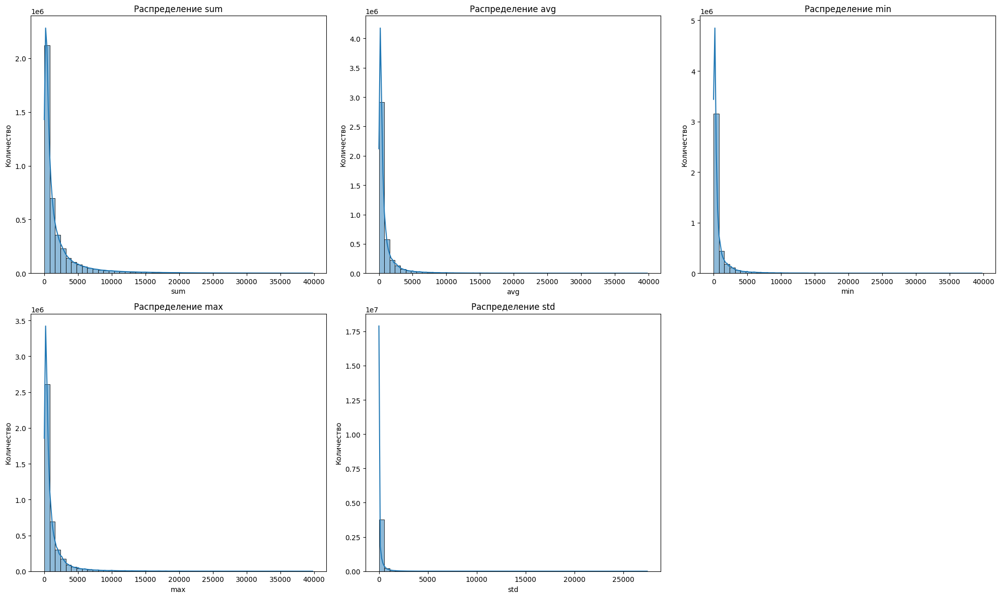

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Настройка размеров фигуры
plt.figure(figsize=(20, 12))

# Список колонок для визуализации
transaction_columns = ['sum', 'avg', 'min', 'max', 'std']

# Создание гистограмм для каждой колонки
for i, col in enumerate(transaction_columns, 1):
    plt.subplot(2, 3, i)  # 2 строки, 3 колонки, i-тый график
    sns.histplot(transactions_df[col], bins=50, kde=True)
    plt.title(f'Распределение {col}')
    plt.xlabel(col)
    plt.ylabel('Количество')

# Показываем графики
plt.tight_layout()
plt.show()


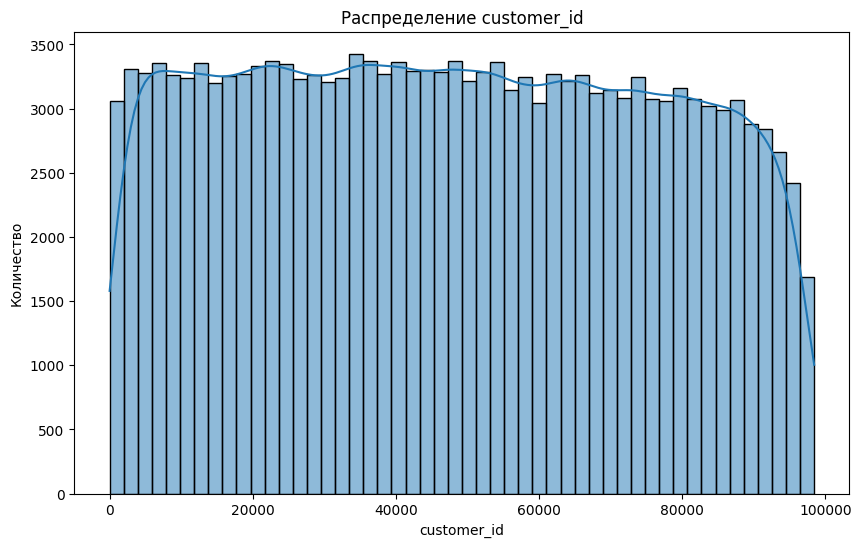

In [7]:
# Гистограмма для 'customer_id'
plt.figure(figsize=(10, 6))
sns.histplot(target_df['customer_id'], bins=50, kde=True)
plt.title('Распределение customer_id')
plt.xlabel('customer_id')
plt.ylabel('Количество')
plt.show()


### Банкоматы hexses_data и hexses_target на карте

In [8]:
import h3
import folium

from IPython.display import display, HTML

df = pd.DataFrame({'h3_09': hexses_data.squeeze()})

moscow_lat, moscow_lng = 55.7558, 37.6173

df['polygons'] = df['h3_09'].apply(lambda x: h3.h3_to_geo_boundary(x, geo_json=False))

map1 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

for _, row in df.iterrows():
    folium.Polygon(locations=row['polygons'], color="blue", weight=2, fill=True, fill_color="blue", fill_opacity=0.4).add_to(map1)



df = pd.DataFrame({'h3_09': hexses_target.squeeze()})

df['polygons'] = df['h3_09'].apply(lambda x: h3.h3_to_geo_boundary(x, geo_json=False))

map2 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

for _, row in df.iterrows():
    folium.Polygon(locations=row['polygons'], color="blue", weight=2, fill=True, fill_color="blue", fill_opacity=0.4).add_to(map2)


map1_html = map1._repr_html_()
map2_html = map2._repr_html_()

template = """
<div style="display: flex;">
    <div style="width: 50%;">{map1}</div>
    <div style="width: 50%;">{map2}</div>
</div>
""".format(map1=map1_html, map2=map2_html)

# Display the maps
display(HTML(template))

In [9]:
not_empty_moscow_df = moscow_df.dropna()
not_empty_moscow_df

,id,tags,lat,lon
0,1000,"[(comment, ООО ""АСП-ГРУПП"", ИНН 7735108290, до...",55.995115,37.207532
1,26609007,"[(ele, 190), (iata, SVO), (icao, UUEE), (name,...",55.987408,37.420944
2,26999673,"[(alt_name, Москва-Октябрьская), (esr:user, 06...",55.778834,37.653721
16,26999981,"[(name, Подрезково), (name:en, Podrezkovo), (p...",55.941962,37.334361
18,26999985,"[(esr:user, 060406), (express:user, 2005090), ...",55.949653,37.299001
...,...,...,...,...
8867761,11574072808,"[(addr:flats, 1-18), (entrance, staircase), (r...",55.788764,37.639026
8867766,11574072813,"[(barrier, bollard)]",55.788792,37.639404
8867769,11574072816,"[(barrier, lift_gate), (bicycle, yes), (foot, ...",55.788636,37.639270
8867774,11574347530,"[(amenity, library), (contact:telegram, https:...",55.770631,37.675718


In [10]:
not_empty_moscow_df['tags'][0]

[('comment', 'ООО "АСП-ГРУПП", ИНН 7735108290, до 22:45 c 2014-05-23'),
 ('name', 'Десяточка'),
 ('opening_hours', '08:30-22:45'),
 ('shop', 'supermarket')]

In [11]:
not_empty_moscow_df['keys'] = not_empty_moscow_df['tags'].apply(lambda x: [y[0] for y in x])
not_empty_moscow_df['keys'] = not_empty_moscow_df['keys'].apply(lambda x: ' '.join([str(y) for y in x]))
not_empty_moscow_df.head()

,id,tags,lat,lon,keys
0,1000,"[(comment, ООО ""АСП-ГРУПП"", ИНН 7735108290, до...",55.995115,37.207532,comment name opening_hours shop
1,26609007,"[(ele, 190), (iata, SVO), (icao, UUEE), (name,...",55.987408,37.420944,ele iata icao name source website wikidata wik...
2,26999673,"[(alt_name, Москва-Октябрьская), (esr:user, 06...",55.778834,37.653721,alt_name esr:user loc_name loc_name:website na...
16,26999981,"[(name, Подрезково), (name:en, Podrezkovo), (p...",55.941962,37.334361,name name:en public_transport railway train
18,26999985,"[(esr:user, 060406), (express:user, 2005090), ...",55.949653,37.299001,esr:user express:user name name:en operator:br...


### Преобразование h3 индекса в широту и долготу

In [14]:
import h3

# Convert H3 index to latitude and longitude
def h3_to_latlng(h3_index):
    lat, lng = h3.h3_to_geo(h3_index)  # Returns (lat, lng)
    return lat, lng

# Convert latitude and longitude back to H3 index
def latlng_to_h3(lat, lng, resolution=9):
    return h3.geo_to_h3(lat, lng, resolution)

transactions_df['trans_lat'] = transactions_df['h3_09'].apply(lambda x: h3_to_latlng(x)[0])
transactions_df['trans_lng'] = transactions_df['h3_09'].apply(lambda x: h3_to_latlng(x)[1])

In [15]:
def add_h3_features(df, h3_column_name):
    df['h3_area'] = df[h3_column_name].apply(lambda x: h3.cell_area(x, unit='m^2'))
    
   
    parent_level = 8  
    child_level = 10  
    df['h3_parent_index'] = df[h3_column_name].apply(lambda x: h3.h3_to_parent(x, parent_level))
    df['parent_lat'] = df['h3_parent_index'].apply(lambda x: h3_to_latlng(x)[0])
    df['parent_lng'] = df['h3_parent_index'].apply(lambda x: h3_to_latlng(x)[1])
    
    df['h3_grandparent_index'] = df['h3_parent_index'].apply(lambda x: h3.h3_to_parent(x, 7))
    df['grandparent_lat'] = df['h3_grandparent_index'].apply(lambda x: h3_to_latlng(x)[0])
    df['grandparent_lng'] = df['h3_grandparent_index'].apply(lambda x: h3_to_latlng(x)[1])
    
    df = df.drop(columns=['h3_grandparent_index', 'h3_parent_index'])

    return df

transactions_df = add_h3_features(transactions_df, 'h3_09')

In [16]:
transactions_df.head()

,h3_09,customer_id,datetime_id,count,sum,avg,min,max,std,count_distinct,mcc_code,trans_lat,trans_lng,h3_area,parent_lat,parent_lng,grandparent_lat,grandparent_lng
0,8911aa4c62fffff,1,3,1,3346.65,3346.650,3346.65,3346.65,0.000000,1,13,55.565522,37.445024,98575.929237,55.565814,37.439905,55.560949,37.428592
1,8911aa7b5b3ffff,4,3,1,450.00,450.000,450.00,450.00,0.000000,1,8,55.699940,37.502864,98595.608823,55.699649,37.508002,55.691334,37.508937
2,8911aa63623ffff,5,3,10,11035.69,1103.569,59.00,3620.18,1190.530333,6,13,55.784319,37.665680,98761.754503,55.784319,37.665680,55.779463,37.654259
3,8911aa48577ffff,9,2,2,628.00,314.000,295.00,333.00,26.870058,2,5,55.472146,37.294992,98424.634484,55.469279,37.297017,55.472720,37.284787
4,8911aa78297ffff,11,2,1,4155.00,4155.000,4155.00,4155.00,0.000000,1,10,55.691497,37.602534,98721.395521,55.688626,37.604553,55.685162,37.616852


### Попытка поработать с moscow_df

In [17]:
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0
    
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    distance = R * c 
    
    return distance


def find_3_closest_from_moscow(lat, lng, moscow: pd.DataFrame):
    # Vectorized computation of distances
    distances = haversine(lat, lng, moscow['lat'].values, moscow['lon'].values)
    
    # Get the indices of the three smallest distances
    min_indices = np.argsort(distances)[:3]
    
    # Retrieve the corresponding tags and distances
    closest = [{'tag': moscow.iloc[i]['keys'], 'distance': distances[i]} for i in min_indices]
    
    return closest

find_3_closest_from_moscow(transactions_df.loc[1]['trans_lat'], transactions_df.loc[1]['trans_lng'], not_empty_moscow_df)

[{'tag': 'bus name public_transport', 'distance': 0.04635760986781046},
 {'tag': 'barrier', 'distance': 0.05019590845397806},
 {'tag': 'shop', 'distance': 0.051286663159238535}]

### Аггрегация по customer_id

In [18]:
from statistics import mode 

In [19]:
new_trans_df = transactions_df.copy()

new_trans_df['customer_id'] = new_trans_df['customer_id'].astype(int)

customer_data = new_trans_df.groupby(by='customer_id', as_index=False).agg(
    sum_mean=pd.NamedAgg('sum', 'mean'),
    sum_min=pd.NamedAgg('sum', 'min'),
    sum_max=pd.NamedAgg('sum', 'max'),
    sum_std=pd.NamedAgg('sum', 'std'),
    
    avg_mean=pd.NamedAgg('avg', 'mean'),
    avg_min=pd.NamedAgg('avg', 'min'),
    avg_max=pd.NamedAgg('avg', 'max'),
    avg_std=pd.NamedAgg('avg', 'std'),
    
    min_min = pd.NamedAgg('min', 'min'),
    max_max = pd.NamedAgg('max', 'max'),
    
    count_mean=pd.NamedAgg('count', 'mean'),
    count_min=pd.NamedAgg('count', 'min'),
    count_max=pd.NamedAgg('count', 'max'),
    count_std=pd.NamedAgg('count', 'std'),
    
    cd_mean=pd.NamedAgg('count_distinct', 'mean'),
    cd_min=pd.NamedAgg('count_distinct', 'min'),
    cd_max=pd.NamedAgg('count_distinct', 'max'),
    cd_std=pd.NamedAgg('count_distinct', 'std'),
    
    trans_lat_mean=pd.NamedAgg('trans_lat', 'mean'),
    trans_lat_min=pd.NamedAgg('trans_lat', 'min'),
    trans_lat_max=pd.NamedAgg('trans_lat', 'max'),
    trans_lat_std=pd.NamedAgg('trans_lat', 'std'),
    
    trans_lng_mean=pd.NamedAgg('trans_lng', 'mean'),
    trans_lng_min=pd.NamedAgg('trans_lng', 'min'),
    trans_lng_max=pd.NamedAgg('trans_lng', 'max'),
    trans_lng_std=pd.NamedAgg('trans_lng', 'std'),
    
    parent_lat_mean=pd.NamedAgg('parent_lat', 'mean'),
    parent_lat_min=pd.NamedAgg('parent_lat', 'min'),
    parent_lat_max=pd.NamedAgg('parent_lat', 'max'),
    parent_lat_std=pd.NamedAgg('parent_lat', 'std'),
    
    parent_lng_mean=pd.NamedAgg('parent_lng', 'mean'),
    parent_lng_min=pd.NamedAgg('parent_lng', 'min'),
    parent_lng_max=pd.NamedAgg('parent_lng', 'max'),
    parent_lng_std=pd.NamedAgg('parent_lng', 'std'),
    
    grandparent_lat_mean=pd.NamedAgg('parent_lat', 'mean'),
    grandparent_lat_min=pd.NamedAgg('parent_lat', 'min'),
    grandparent_lat_max=pd.NamedAgg('parent_lat', 'max'),
    grandparent_lat_std=pd.NamedAgg('parent_lat', 'std'),
    
    grandparent_lng_mean=pd.NamedAgg('grandparent_lng', 'mean'),
    grandparent_lng_min=pd.NamedAgg('grandparent_lng', 'min'),
    grandparent_lng_max=pd.NamedAgg('grandparent_lng', 'max'),
    grandparent_lng_std=pd.NamedAgg('grandparent_lng', 'std'),
    
    mcc_code_mode=pd.NamedAgg('mcc_code', mode),
    datetime_mode=pd.NamedAgg('datetime_id', mode),
)

customer_data.head()

,customer_id,sum_mean,sum_min,sum_max,sum_std,avg_mean,avg_min,avg_max,avg_std,min_min,max_max,count_mean,count_min,count_max,count_std,cd_mean,cd_min,cd_max,cd_std,trans_lat_mean,trans_lat_min,trans_lat_max,trans_lat_std,trans_lng_mean,trans_lng_min,trans_lng_max,trans_lng_std,parent_lat_mean,parent_lat_min,parent_lat_max,parent_lat_std,parent_lng_mean,parent_lng_min,parent_lng_max,parent_lng_std,grandparent_lat_mean,grandparent_lat_min,grandparent_lat_max,grandparent_lat_std,grandparent_lng_mean,grandparent_lng_min,grandparent_lng_max,grandparent_lng_std,mcc_code_mode,datetime_mode
0,1,1873.168611,50.0,27952.65,4099.268736,894.084370,37.500,7827.60,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.226170,37.664566,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2
1,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.00,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3
2,5,1804.113333,4.0,11035.69,2188.518766,1202.251856,4.000,7538.00,1342.738428,4.0,7538.00,1.597701,1,10,1.474274,1.298851,1,6,0.850649,55.743464,55.608587,55.845508,0.068165,37.654474,37.360099,37.925265,0.087372,55.743446,55.608885,55.845508,0.068538,37.655340,37.360099,37.925265,0.087182,55.743446,55.608885,55.845508,0.068538,37.657664,37.359132,37.912956,0.086105,8,3
3,9,2457.110968,54.0,23707.00,4651.378429,439.067496,54.000,2331.48,508.592483,8.0,2331.48,7.451613,1,75,14.735080,1.193548,1,3,0.542792,55.587875,55.471859,55.852402,0.125663,37.389115,36.918866,37.922115,0.283393,55.587751,55.469279,55.855265,0.126303,37.389682,36.916821,37.925265,0.285035,55.587751,55.469279,55.855265,0.126303,37.386747,36.928005,37.912956,0.281408,13,1
4,11,6825.972308,112.0,36078.00,8377.164609,3692.381975,56.000,31670.00,4861.871828,40.0,31670.00,2.784615,1,45,5.893567,1.461538,1,8,1.225726,55.726734,55.611163,55.910028,0.057496,37.602943,37.508629,37.922115,0.107719,55.725709,55.608885,55.910316,0.057181,37.603059,37.511740,37.925265,0.108847,55.725709,55.608885,55.910316,0.057181,37.603487,37.523100,37.912956,0.105936,8,3


In [20]:
customer_data['customer_id'].nunique(), len(customer_data['customer_id'])

(69337, 69337)

In [21]:
train_data = customer_data.merge(target_df, on='customer_id')
train_data.head()

,customer_id,sum_mean,sum_min,sum_max,sum_std,avg_mean,avg_min,avg_max,avg_std,min_min,max_max,count_mean,count_min,count_max,count_std,cd_mean,cd_min,cd_max,cd_std,trans_lat_mean,trans_lat_min,trans_lat_max,trans_lat_std,trans_lng_mean,trans_lng_min,trans_lng_max,trans_lng_std,parent_lat_mean,parent_lat_min,parent_lat_max,parent_lat_std,parent_lng_mean,parent_lng_min,parent_lng_max,parent_lng_std,grandparent_lat_mean,grandparent_lat_min,grandparent_lat_max,grandparent_lat_std,grandparent_lng_mean,grandparent_lng_min,grandparent_lng_max,grandparent_lng_std,mcc_code_mode,datetime_mode,h3_09
0,1,1873.168611,50.0,27952.65,4099.268736,894.084370,37.500,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.226170,37.664566,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,8911aa4cc2fffff
1,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.0,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3,8911aa4e167ffff
2,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.0,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3,8911aa4565bffff
3,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.0,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3,8911aa7b453ffff
4,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.0,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3,8911aa45853ffff


### Преобразование target'ов в широту и долготу

In [22]:
train_data['atm_lat'] = train_data['h3_09'].apply(lambda x: h3_to_latlng(x)[0])
train_data['atm_lng'] = train_data['h3_09'].apply(lambda x: h3_to_latlng(x)[1])

train_data.head()

,customer_id,sum_mean,sum_min,sum_max,sum_std,avg_mean,avg_min,avg_max,avg_std,min_min,max_max,count_mean,count_min,count_max,count_std,cd_mean,cd_min,cd_max,cd_std,trans_lat_mean,trans_lat_min,trans_lat_max,trans_lat_std,trans_lng_mean,trans_lng_min,trans_lng_max,trans_lng_std,parent_lat_mean,parent_lat_min,parent_lat_max,parent_lat_std,parent_lng_mean,parent_lng_min,parent_lng_max,parent_lng_std,grandparent_lat_mean,grandparent_lat_min,grandparent_lat_max,grandparent_lat_std,grandparent_lng_mean,grandparent_lng_min,grandparent_lng_max,grandparent_lng_std,mcc_code_mode,datetime_mode,h3_09,atm_lat,atm_lng
0,1,1873.168611,50.0,27952.65,4099.268736,894.084370,37.500,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.226170,37.664566,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,8911aa4cc2fffff,55.619647,37.510188
1,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.0,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3,8911aa4e167ffff,55.620307,37.401452
2,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.0,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3,8911aa4565bffff,55.632348,37.333877
3,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.0,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3,8911aa7b453ffff,55.665266,37.482962
4,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.0,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3,8911aa45853ffff,55.687368,37.432845


In [23]:
train_data = train_data.drop(columns=['h3_09'])

In [24]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157806 entries, 0 to 157805
Data columns (total 47 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   customer_id           157806 non-null  int64  
 1   sum_mean              157806 non-null  float64
 2   sum_min               157806 non-null  float64
 3   sum_max               157806 non-null  float64
 4   sum_std               157806 non-null  float64
 5   avg_mean              157806 non-null  float64
 6   avg_min               157806 non-null  float64
 7   avg_max               157806 non-null  float64
 8   avg_std               157806 non-null  float64
 9   min_min               157806 non-null  float64
 10  max_max               157806 non-null  float64
 11  count_mean            157806 non-null  float64
 12  count_min             157806 non-null  int64  
 13  count_max             157806 non-null  int64  
 14  count_std             157806 non-null  float64
 15  

<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Подготовка данных к обучению</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [25]:
X_lat = train_data.drop(columns=['customer_id', 'atm_lat', 'atm_lng'])
X_lng = train_data.drop(columns=['customer_id', 'atm_lng'])
y_lat = train_data['atm_lat']
y_lng = train_data['atm_lng']

In [26]:
X_lat_train, X_lat_valid, y_lat_train, y_lat_valid = train_test_split(X_lat, y_lat)
X_lng_train, X_lng_valid, y_lng_train, y_lng_valid = train_test_split(X_lng, y_lng)

X_lat_train.shape, X_lng_valid.shape

((118354, 44), (39452, 45))


<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Обучение</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [27]:
lat_reg = CatBoostRegressor(
    iterations=10000,
    l2_leaf_reg=0.2,
    use_best_model=True,
    random_seed=42,
    early_stopping_rounds=30,
    leaf_estimation_method='Newton',
    bootstrap_type='MVS',
    posterior_sampling=True,
)

lat_reg.fit(X_lat_train, y_lat_train, eval_set=(X_lat_valid, y_lat_valid), verbose=25)

0:	learn: 0.0826187	test: 0.0821004	best: 0.0821004 (0)	total: 64.5ms	remaining: 10m 45s
25:	learn: 0.0672451	test: 0.0670904	best: 0.0670904 (25)	total: 198ms	remaining: 1m 16s
50:	learn: 0.0628826	test: 0.0629568	best: 0.0629568 (50)	total: 334ms	remaining: 1m 5s
75:	learn: 0.0616160	test: 0.0618118	best: 0.0618118 (75)	total: 466ms	remaining: 1m
100:	learn: 0.0611615	test: 0.0614324	best: 0.0614324 (100)	total: 595ms	remaining: 58.3s
125:	learn: 0.0609369	test: 0.0612587	best: 0.0612587 (125)	total: 722ms	remaining: 56.5s
150:	learn: 0.0607897	test: 0.0611541	best: 0.0611541 (150)	total: 848ms	remaining: 55.3s
175:	learn: 0.0606688	test: 0.0610832	best: 0.0610832 (175)	total: 978ms	remaining: 54.6s
200:	learn: 0.0605632	test: 0.0610168	best: 0.0610168 (200)	total: 1.11s	remaining: 53.9s
225:	learn: 0.0604644	test: 0.0609650	best: 0.0609650 (225)	total: 1.24s	remaining: 53.6s
250:	learn: 0.0603757	test: 0.0609180	best: 0.0609180 (250)	total: 1.38s	remaining: 53.6s
275:	learn: 0.06030

In [28]:
lng_reg = CatBoostRegressor(
    iterations=10000,
    l2_leaf_reg=0.2,
    use_best_model=True,
    random_seed=42,
    early_stopping_rounds=30,
    leaf_estimation_method='Newton',
    bootstrap_type='MVS',
    posterior_sampling=True,
    eval_metric='RMSE'
)

lng_reg.fit(X_lng_train, y_lng_train, eval_set=(X_lng_valid, y_lng_valid), verbose=25)

0:	learn: 0.1173261	test: 0.1160466	best: 0.1160466 (0)	total: 6.53ms	remaining: 1m 5s
25:	learn: 0.0926473	test: 0.0918102	best: 0.0918102 (25)	total: 141ms	remaining: 54.2s
50:	learn: 0.0827501	test: 0.0820526	best: 0.0820526 (50)	total: 281ms	remaining: 54.9s
75:	learn: 0.0780009	test: 0.0774028	best: 0.0774028 (75)	total: 435ms	remaining: 56.8s
100:	learn: 0.0751815	test: 0.0747262	best: 0.0747262 (100)	total: 569ms	remaining: 55.8s
125:	learn: 0.0733072	test: 0.0730096	best: 0.0730096 (125)	total: 700ms	remaining: 54.9s
150:	learn: 0.0718332	test: 0.0716320	best: 0.0716320 (150)	total: 830ms	remaining: 54.1s
175:	learn: 0.0707359	test: 0.0706557	best: 0.0706557 (175)	total: 964ms	remaining: 53.8s
200:	learn: 0.0697872	test: 0.0697955	best: 0.0697955 (200)	total: 1.11s	remaining: 54.2s
225:	learn: 0.0689961	test: 0.0690756	best: 0.0690756 (225)	total: 1.25s	remaining: 54.1s
250:	learn: 0.0683017	test: 0.0684321	best: 0.0684321 (250)	total: 1.38s	remaining: 53.8s
275:	learn: 0.06762

In [29]:
lat_reg.save_model('../models/lat_catboost_reg')
lng_reg.save_model('../models/lng_catboost_reg')


<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Предсказание для hexses_target</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [30]:
lat_reg = CatBoostRegressor().load_model('../models/lat_catboost_reg')
lng_reg = CatBoostRegressor().load_model('../models/lng_catboost_reg')

In [31]:
test_data = train_data.drop_duplicates(subset='customer_id').drop(columns=['atm_lat', 'atm_lng'])
test_data.shape

(69337, 45)

In [32]:
test_data.head()

,customer_id,sum_mean,sum_min,sum_max,sum_std,avg_mean,avg_min,avg_max,avg_std,min_min,max_max,count_mean,count_min,count_max,count_std,cd_mean,cd_min,cd_max,cd_std,trans_lat_mean,trans_lat_min,trans_lat_max,trans_lat_std,trans_lng_mean,trans_lng_min,trans_lng_max,trans_lng_std,parent_lat_mean,parent_lat_min,parent_lat_max,parent_lat_std,parent_lng_mean,parent_lng_min,parent_lng_max,parent_lng_std,grandparent_lat_mean,grandparent_lat_min,grandparent_lat_max,grandparent_lat_std,grandparent_lng_mean,grandparent_lng_min,grandparent_lng_max,grandparent_lng_std,mcc_code_mode,datetime_mode
0,1,1873.168611,50.0,27952.65,4099.268736,894.084370,37.500,7827.60,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.226170,37.664566,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2
1,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.00,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3
6,5,1804.113333,4.0,11035.69,2188.518766,1202.251856,4.000,7538.00,1342.738428,4.0,7538.00,1.597701,1,10,1.474274,1.298851,1,6,0.850649,55.743464,55.608587,55.845508,0.068165,37.654474,37.360099,37.925265,0.087372,55.743446,55.608885,55.845508,0.068538,37.655340,37.360099,37.925265,0.087182,55.743446,55.608885,55.845508,0.068538,37.657664,37.359132,37.912956,0.086105,8,3
7,9,2457.110968,54.0,23707.00,4651.378429,439.067496,54.000,2331.48,508.592483,8.0,2331.48,7.451613,1,75,14.735080,1.193548,1,3,0.542792,55.587875,55.471859,55.852402,0.125663,37.389115,36.918866,37.922115,0.283393,55.587751,55.469279,55.855265,0.126303,37.389682,36.916821,37.925265,0.285035,55.587751,55.469279,55.855265,0.126303,37.386747,36.928005,37.912956,0.281408,13,1
9,11,6825.972308,112.0,36078.00,8377.164609,3692.381975,56.000,31670.00,4861.871828,40.0,31670.00,2.784615,1,45,5.893567,1.461538,1,8,1.225726,55.726734,55.611163,55.910028,0.057496,37.602943,37.508629,37.922115,0.107719,55.725709,55.608885,55.910316,0.057181,37.603059,37.511740,37.925265,0.108847,55.725709,55.608885,55.910316,0.057181,37.603487,37.523100,37.912956,0.105936,8,3


In [33]:
X = test_data.drop(columns=['customer_id'])

lat_preds = lat_reg.predict(X)

X['atm_lat'] = lat_preds

lng_preds = lng_reg.predict(X)

lat_preds.shape

(69337,)

In [34]:
preds_df = pd.DataFrame({'customer_id': test_data['customer_id'].values, 'atm_lat': lat_preds, 'atm_lng': lng_preds})

preds_df.head()

,customer_id,atm_lat,atm_lng
0,1,55.632358,37.447431
1,4,55.669438,37.499149
2,5,55.751107,37.635641
3,9,55.570788,37.521299
4,11,55.721016,37.576628


In [35]:
hexses_target_lats_lngs = [h3_to_latlng(x[0]) for x in hexses_target]

hexses_target_lats_lngs[:3]

[(55.29129803589772, 37.18318153036113),
 (55.28843199726417, 37.185202942051205),
 (55.50397157837651, 37.557006425341996)]

In [36]:
import numpy as np

def calculate_probabilities_vectorized(preds_df, hexses_target_lats_lngs, decay_param=0.1):
    # Extract latitudes and longitudes from predictions and hex targets
    atm_lats = preds_df['atm_lat'].values[:, np.newaxis]  # Shape (N, 1) where N is number of ATMs
    atm_lngs = preds_df['atm_lng'].values[:, np.newaxis]  # Shape (N, 1)

    # Convert list of tuples to a 2D NumPy array
    hexses_arr = np.array(hexses_target_lats_lngs)  # Shape (M, 2) where M is number of hexes
    target_lats = hexses_arr[:, 0]  # Shape (M,)
    target_lngs = hexses_arr[:, 1]  # Shape (M,)

    # Compute all distances at once using broadcasting
    # The resulting array will have shape (N, M)
    distances = np.sqrt((atm_lats - target_lats) ** 2 + (atm_lngs - target_lngs) ** 2)

    # Apply decay function to distances to get probabilities
    probas = np.exp(-decay_param * distances)

    # Normalize probabilities so they sum to 1 across each row (for each ATM)
    probas /= probas.sum(axis=1)[:, np.newaxis]  # Normalize across targets for each ATM

    return probas

In [37]:
probas = calculate_probabilities_vectorized(preds_df=preds_df, hexses_target_lats_lngs=hexses_target_lats_lngs)

<Axes: >

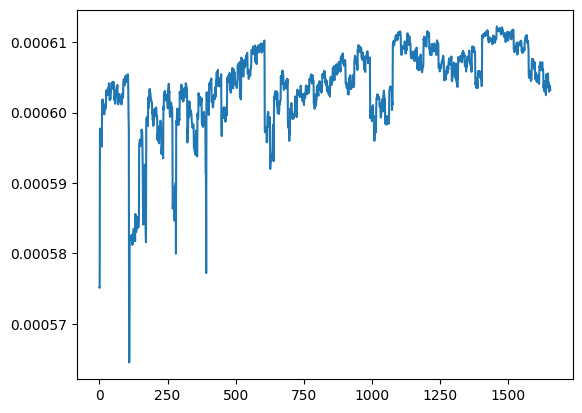

In [38]:
sns.lineplot(probas[10000])

In [39]:
submit_d = {x: [x[i] for x in probas] for i, x in enumerate(hexses_target.squeeze())}
submit_d['customer_id'] = preds_df['customer_id'].values

submit_df = pd.DataFrame(submit_d)

submit_df.head()

,89118195133ffff,8911819513bffff,891181b2827ffff,891181b2957ffff,891181b2b83ffff,891181b2b97ffff,891181b2ba7ffff,891181b2bb3ffff,891181b2d1bffff,891181b2e6bffff,891181b4513ffff,891181b451bffff,891181b45c3ffff,891181b45d7ffff,891181b4c8fffff,891181b4ca7ffff,891181b4cb3ffff,891181b4cd3ffff,891181b4d2fffff,891181b4d9bffff,891181b4da7ffff,891181b4dbbffff,891181b4dcbffff,891181b4dd3ffff,891181b4dd7ffff,...,8911aa7b42fffff,8911aa7b453ffff,8911aa7b45bffff,8911aa7b47bffff,8911aa7b4a7ffff,8911aa7b4afffff,8911aa7b4cfffff,8911aa7b4dbffff,8911aa7b54fffff,8911aa7b573ffff,8911aa7b583ffff,8911aa7b587ffff,8911aa7b593ffff,8911aa7b597ffff,8911aa7b5a7ffff,8911aa7b5b3ffff,8911aa7b617ffff,8911aa7b637ffff,8911aa7b643ffff,8911aa7b65bffff,8911aa7b663ffff,8911aa7b67bffff,8911aa7b687ffff,8911aa7b68fffff,customer_id
0,0.000591,0.000591,0.000607,0.000607,0.000606,0.000607,0.000606,0.000606,0.000609,0.000606,0.000603,0.000603,0.000603,0.000603,0.000600,0.000599,0.000600,0.000600,0.000597,0.000599,0.000598,0.000598,0.000598,0.000599,0.000599,...,0.000613,0.000614,0.000614,0.000614,0.000613,0.000613,0.000614,0.000615,0.000612,0.000612,0.000613,0.000612,0.000613,0.000612,0.000612,0.000612,0.000614,0.000613,0.000614,0.000614,0.000613,0.000613,0.000614,0.000614,1
1,0.000585,0.000585,0.000604,0.000604,0.000604,0.000604,0.000604,0.000604,0.000605,0.000603,0.000603,0.000602,0.000603,0.000603,0.000600,0.000599,0.000600,0.000600,0.000597,0.000599,0.000598,0.000599,0.000599,0.000599,0.000599,...,0.000614,0.000614,0.000614,0.000615,0.000614,0.000614,0.000614,0.000613,0.000614,0.000613,0.000613,0.000613,0.000613,0.000613,0.000613,0.000613,0.000614,0.000614,0.000613,0.000613,0.000613,0.000613,0.000614,0.000614,4
2,0.000574,0.000574,0.000597,0.000597,0.000597,0.000597,0.000597,0.000597,0.000597,0.000595,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000601,0.000602,0.000602,0.000602,0.000601,0.000602,0.000602,...,0.000603,0.000602,0.000602,0.000603,0.000603,0.000603,0.000602,0.000601,0.000604,0.000604,0.000603,0.000604,0.000603,0.000603,0.000604,0.000604,0.000603,0.000603,0.000602,0.000602,0.000603,0.000603,0.000602,0.000602,5
3,0.000591,0.000591,0.000613,0.000613,0.000612,0.000613,0.000612,0.000613,0.000614,0.000612,0.000608,0.000608,0.000608,0.000608,0.000604,0.000604,0.000604,0.000605,0.000601,0.000603,0.000602,0.000603,0.000603,0.000603,0.000603,...,0.000611,0.000611,0.000612,0.000612,0.000610,0.000611,0.000611,0.000611,0.000611,0.000611,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000612,0.000612,0.000613,0.000613,0.000613,0.000613,0.000612,0.000612,9
4,0.000578,0.000578,0.000599,0.000600,0.000599,0.000599,0.000599,0.000599,0.000600,0.000597,0.000602,0.000602,0.000602,0.000602,0.000600,0.000600,0.000601,0.000601,0.000599,0.000600,0.000600,0.000600,0.000600,0.000600,0.000600,...,0.000607,0.000606,0.000606,0.000607,0.000607,0.000607,0.000606,0.000605,0.000608,0.000608,0.000607,0.000608,0.000607,0.000607,0.000608,0.000608,0.000606,0.000607,0.000606,0.000606,0.000607,0.000607,0.000606,0.000606,11
